# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Выполнил:** Каюмов Вадим Рустамович (tg: @ledovsk1y)

**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [62]:
!pip install ydata_profiling

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport

random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Your answer here` Сиды фиксируем для воспроизводимости результатов

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


In [3]:
df_train_copy = df_train.copy()
df_test_copy = df_test.copy()

In [4]:
df_train.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
5,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.3 km/kg,1061 CC,57.5 bhp,"7.8@ 4,500(kgm@ rpm)",5.0
6,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.1 kmpl,796 CC,37 bhp,59Nm@ 2500rpm,4.0
7,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59 kmpl,1364 CC,67.1 bhp,170Nm@ 1800-2400rpm,5.0
8,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.0 kmpl,1399 CC,68.1 bhp,160Nm@ 2000rpm,5.0
9,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01 kmpl,1461 CC,108.45 bhp,248Nm@ 2250rpm,5.0


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [5]:
# смотрим пропуски
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


In [6]:
# смотрим пропуски
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


In [7]:
# смотрим явные дубли 
df_train[df_train.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
326,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6880,Renault Captur 1.5 Diesel RXT,2018,1265000,12000,Diesel,Individual,Manual,First Owner,20.37 kmpl,1461 CC,108.45 bhp,240Nm@ 1750rpm,5.0
6881,Maruti Ciaz Alpha Diesel,2019,1025000,32000,Diesel,Individual,Manual,First Owner,28.09 kmpl,1248 CC,88.50 bhp,200Nm@ 1750rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [8]:
# смотрим явные дубли 
df_test[df_test.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
200,Maruti Swift AMT VVT VXI,2019,650000,5621,Petrol,Trustmark Dealer,Automatic,First Owner,22.0 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
235,Hyundai Grand i10 1.2 CRDi Sportz,2017,450000,56290,Diesel,Dealer,Manual,First Owner,24.0 kmpl,1186 CC,73.97 bhp,190.24nm@ 1750-2250rpm,5.0
238,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
253,Tata Safari Storme EX,2015,503000,110000,Diesel,Individual,Manual,First Owner,14.1 kmpl,2179 CC,147.94 bhp,320Nm@ 1500-3000rpm,7.0
269,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
934,Mercedes-Benz S-Class S 350 CDI,2017,6000000,37000,Diesel,Dealer,Automatic,First Owner,13.5 kmpl,2987 CC,254.79 bhp,620Nm@ 1600-2400rpm,5.0
936,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
949,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
971,Maruti Ertiga SHVS ZDI Plus,2017,750000,50000,Diesel,Individual,Manual,First Owner,24.52 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,7.0


In [9]:
profile_train = ProfileReport(df_train, title="Profiling Report (Train)")
profile_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 104.70it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
profile_test = ProfileReport(df_test, title="Profiling Report (test)")
profile_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 4085.26it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Ответ**
- Есть пропуски в колонках `mileage, engine, max_power, torque, seats`, и не совсем понятный формат данных в некоторых из этих колонок
- В данных встречаются пропуски и явные дубли, не хватает знаний о датасете, чтобы принять решения, надо ли что-то с ними делать
- Самая частое слово в name - hyundai, maruti, swift (видимо, марки и модели машин)
- Среднее по полю year (видимо, год выпуска) - 2013
- Чуть больше машин на дизеле, большинство продаются индивидуальными лицами, чаще всего на "механике", с одним владельцем
- Есть сильная обратная корреляция между годом выпуска и пробегом, и сильная корреляция между годом выпуска и ценой, типом трансмиссии и ценой, у остальных признаков корреляция выражена слабее

p.s. надеюсь, правильно понял значение колонок :)

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [11]:
# Посмотрим для всех колонок сразу
df_train.describe(include='all')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
count,6999,6999.000000,6.999000e+03,6.999000e+03,6999,6999,6999,6999,6797,6797,6803,6796,6797.000000
unique,1924,NaN,NaN,NaN,4,3,2,5,386,120,316,419,NaN
top,Maruti Swift Dzire VDI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,NaN
freq,116,NaN,NaN,NaN,3793,5826,6095,4587,197,885,330,468,NaN
mean,NaN,2013.818403,6.395152e+05,6.958462e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.419008
std,NaN,4.053095,8.089419e+05,5.772400e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965767
min,NaN,1983.000000,2.999900e+04,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000
25%,NaN,2011.000000,2.549990e+05,3.500000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
50%,NaN,2015.000000,4.500000e+05,6.000000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
75%,NaN,2017.000000,6.750000e+05,9.700000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000


In [12]:
df_test.describe(include='all')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
count,1000,1000.000000,1.000000e+03,1000.000000,1000,1000,1000,1000,981,981,981,981,981.000000
unique,621,NaN,NaN,NaN,4,3,2,5,237,88,182,226,NaN
top,Maruti Alto 800 LXI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm,NaN
freq,15,NaN,NaN,NaN,534,837,877,623,23,116,43,57,NaN
mean,NaN,2013.681000,6.179010e+05,71393.341000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.410805
std,NaN,4.012149,7.585539e+05,48486.218662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.919985
min,NaN,1995.000000,3.100000e+04,1303.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000
25%,NaN,2011.000000,2.500000e+05,37000.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
50%,NaN,2014.000000,4.349990e+05,61500.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
75%,NaN,2017.000000,6.700000e+05,100000.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000


In [13]:
df_test.selling_price.mean(), df_train.selling_price.mean()

(617901.042, 639515.1971710244)

In [14]:
# для понимания посчитаем относительную разницу средних
print('На сколько отличется цена:', (df_test.selling_price.mean() - df_train.selling_price.mean()) / df_train.selling_price.mean())
print('На сколько отличется пробег:', (df_test.km_driven.mean() - df_train.km_driven.mean()) / df_train.km_driven.mean())
print('На сколько отличется год:', (df_test.year.mean() - df_train.year.mean()) / df_train.year.mean())
print('На сколько отличется число мест:', (df_test.seats.mean() - df_train.seats.mean()) / df_train.seats.mean())

# стат.значима ли разница? можно проверить с помощью t-test
from scipy import stats

def mean_test(g1, g2):
    # полагаем, что дисперсии выборок равны (они из одной генсовокупности)
    # уровень значимости по стандарту задам 0.05
    # альтернатива - двухсторонняя (средние не равны)
    t_stat, p_value = stats.ttest_ind(g1, g2, equal_var=True, alternative='two-sided')
    # print(f"t-статистика: {t_stat:.4f}")
    print(f"p-value: {p_value:.4f}")
    print(f"Среднее g1: {np.mean(g1):.2f}")
    print(f"Среднее g2: {np.mean(g2):.2f}")

    # Интерпретация
    alpha = 0.05
    if p_value < alpha:
        print("Различия статистически значимы (отвергаем H0)")
    else:
        print("Различия не статистически значимы (не отвергаем H0)")

print('-'*10)

print('Проверяем стат. значимость отличий в цене')
mean_test(df_test.selling_price,  df_train.selling_price)

print('-'*10)

print('Проверяем стат. значимость отличий в пробеге')
mean_test(df_test.km_driven,  df_train.km_driven)

print('-'*10)

print('Проверяем стат. значимость отличий в годе')

mean_test(df_test.year,  df_train.year)
print('-'*10)

print('Проверяем стат. значимость отличий в пробеге')
mean_test(df_test.seats,  df_train.seats)

На сколько отличется цена: -0.033797719376548525
На сколько отличется пробег: 0.02599318067754071
На сколько отличется год: -6.822990035628664e-05
На сколько отличется число мест: -0.0015137613295128965
----------
Проверяем стат. значимость отличий в цене
p-value: 0.4258
Среднее g1: 617901.04
Среднее g2: 639515.20
Различия не статистически значимы (не отвергаем H0)
----------
Проверяем стат. значимость отличий в пробеге
p-value: 0.3450
Среднее g1: 71393.34
Среднее g2: 69584.62
Различия не статистически значимы (не отвергаем H0)
----------
Проверяем стат. значимость отличий в годе
p-value: 0.3154
Среднее g1: 2013.68
Среднее g2: 2013.82
Различия не статистически значимы (не отвергаем H0)
----------
Проверяем стат. значимость отличий в пробеге
p-value: nan
Среднее g1: 5.41
Среднее g2: 5.42
Различия не статистически значимы (не отвергаем H0)


**Выводы**
- Есть разница в средней и медианной цене и пробеге - в тестовой выборке средняя цена ниже на 3.4%, средний пробег больше на 2.6% (не статзначимо)
- Разница в числе мест и годе выпуска есть, но менее выраженная
- По категориальным признакам также нет особой разницы
- Итого - различия в трейне и тесте незначительные и не отразятся на итоговом качестве модели

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [15]:
df_train.drop('selling_price', axis=1)[df_train.drop('selling_price', axis=1).duplicated(keep='first')]

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


Дублящиеся наблюдения есть, всего 1159 наблюдений, для которых нашелся хотя бы один дубль

In [16]:
df_train = df_train.drop_duplicates(subset=df_train.drop('selling_price', axis=1).columns, keep='first')

In [17]:
assert df_train.shape == (5840, 13)

In [18]:
df_train.reset_index(drop=True, inplace=True)

df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


**Про скрытые дубли**

Скрытые дубли могут быть, из-за: 
- Незначительных отличий в строковых данных (различия в регистре, языке, пробелах, абревиатур итд)
- Незначительных отличий в числовых данных (например, 45000 и 45001 в пробеге - вполне вероятно, что это объявление с одной и той же машиной, также отличия могут быть из-за разного числа знаков после запятой)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [19]:
df_train.torque

0                  190Nm@ 2000rpm
1             250Nm@ 1500-2500rpm
2        22.4 kgm at 1750-2750rpm
3           11.5@ 4,500(kgm@ rpm)
4               113.75nm@ 4000rpm
                  ...            
5835              96.1Nm@ 3000rpm
5836                90Nm@ 3500rpm
5837             113.7Nm@ 4000rpm
5838    24@ 1,900-2,750(kgm@ rpm)
5839               190Nm@ 2000rpm
Name: torque, Length: 5840, dtype: object

In [20]:
import re

# как вариант - брать первое число как torque, и последнее как max_torque_rpm
# но нужно убедиться, что макс. чисел в строке 3 (либо torque и rpm, либо torque и диапазон) - тогда это будет валидно

def count_numbers(text):
    if pd.isna(text):
        return 0
    pattern = r'\d+[.,]?\d*' # ищем числа, включая целые и дробные, с точкой или запятой в виде разделителя
    numbers = re.findall(pattern, str(text))
    return len(numbers)

max(df_train['torque'].apply(count_numbers)) # всё ок, можно брать

3

In [21]:
# 1kgm = 9.80665nm !!!
# сведём всё в nm

def extract_numbers(text):
    mult = 1
    if 'kgm' in str(text).lower():
        mult = 9.80665

    numbers = re.findall(r'\d+[.,]?\d*', str(text))
    if len(numbers) >= 2: 
        return pd.Series([float(numbers[0]) * mult, numbers[-1]])
    elif len(numbers) == 1:
        return pd.Series([float(numbers[0]) * mult, None])
    else:
        return pd.Series([None, None])

df_train['torque'].apply(extract_numbers) # проверить, что корректно работает

,0,1
0,190.000000,2000
1,250.000000,2500
2,219.668960,2750
3,112.776475,"4,500"
4,113.750000,4000
...,...,...
5835,96.100000,3000
5836,90.000000,3500
5837,113.700000,4000
5838,235.359600,"2,750"


In [22]:
df_train[['torque', 'max_torque_rpm']] = df_train['torque'].apply(extract_numbers)
df_train

/var/folders/rg/5cdhwbss5ql_109gby3xdhr80000gn/T/ipykernel_877/1170389111.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train[['torque', 'max_torque_rpm']] = df_train['torque'].apply(extract_numbers)
/var/folders/rg/5cdhwbss5ql_109gby3xdhr80000gn/T/ipykernel_877/1170389111.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train[['torque', 'max_torque_rpm']] = df_train['torque'].apply(extract_numbers)


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190.000000,5.0,2000
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250.000000,5.0,2500
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,219.668960,5.0,2750
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,112.776475,5.0,"4,500"
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.750000,5.0,4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.100000,5.0,3000
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90.000000,5.0,3500
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.700000,5.0,4000
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,235.359600,5.0,"2,750"


In [23]:
df_test[['torque', 'max_torque_rpm']] = df_test['torque'].apply(extract_numbers)
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260.0,7.0,2200
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260.0,5.0,2750
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172.0,5.0,4300
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200.0,5.0,1750
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96.0,5.0,3000


In [24]:
df_train[df_train['max_power'] == ' CC']

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm


In [25]:
df_train.loc[:, 'mileage'] = df_train['mileage'].str.replace(r'[^\d.]+', '', regex=True)
df_train.loc[:, 'engine'] = df_train['engine'].str.replace(' CC', '', regex=True)
df_train.loc[:, 'max_power'] = df_train['max_power'].str.replace(r'[^\d.]+', '', regex=True)

df_test.loc[:, 'mileage'] = df_test['mileage'].str.replace(r'[^\d.]+', '', regex=True)
df_test.loc[:, 'engine'] = df_test['engine'].str.replace(' CC', '', regex=True)
df_test.loc[:, 'max_power'] = df_test['max_power'].str.replace(r'[^\d.]+', '', regex=True)


In [26]:
for col in ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']:
    df_train[col] = pd.to_numeric(df_train[col], errors='coerce')
    df_test[col] = pd.to_numeric(df_test[col], errors='coerce')

/var/folders/rg/5cdhwbss5ql_109gby3xdhr80000gn/T/ipykernel_877/747594173.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train[col] = pd.to_numeric(df_train[col], errors='coerce')


In [27]:
# df_train.loc[:, ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']] = df_train[['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']].astype(float)
# df_test.loc[:, ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']] = df_test[['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']].astype(float)

In [28]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5654 non-null   float64
 9   engine          5654 non-null   float64
 10  max_power       5656 non-null   float64
 11  torque          5653 non-null   float64
 12  seats           5654 non-null   float64
 13  max_torque_rpm  5369 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 638.9+ KB


In [29]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         981 non-null    float64
 9   engine          981 non-null    float64
 10  max_power       981 non-null    float64
 11  torque          981 non-null    float64
 12  seats           981 non-null    float64
 13  max_torque_rpm  941 non-null    float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [30]:
df_train[['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']].median()

mileage             19.37
engine            1248.00
max_power           81.86
torque             160.00
seats                5.00
max_torque_rpm    3000.00
dtype: float64

In [31]:
for col in ['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']:
    df_train[col] = df_train[col].fillna(df_train[col].median())
    df_test[col] = df_test[col].fillna(df_train[col].median())

/var/folders/rg/5cdhwbss5ql_109gby3xdhr80000gn/T/ipykernel_877/1716987946.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train[col] = df_train[col].fillna(df_train[col].median())


In [32]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5840 non-null   float64
 9   engine          5840 non-null   float64
 10  max_power       5840 non-null   float64
 11  torque          5840 non-null   float64
 12  seats           5840 non-null   float64
 13  max_torque_rpm  5840 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 638.9+ KB


In [33]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         1000 non-null   float64
 9   engine          1000 non-null   float64
 10  max_power       1000 non-null   float64
 11  torque          1000 non-null   float64
 12  seats           1000 non-null   float64
 13  max_torque_rpm  1000 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


In [34]:
df_train_copy.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [35]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,175.930478,5.426712,3036.884932
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,116.757608,0.982344,863.736919
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.071920,2.000000,500.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.800000,5.000000,2400.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.055660,5.000000,3750.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,3726.527000,14.000000,5300.000000


**Ответ по заданию**

- **Заполнять пропуски медианой предпочтительнее**, т.к. она устойчива к выбросам. Заменяя средним - смещаем распределение переменной (критично для ненормально и несимметрично распределённых величин). В нашем случае - есть некоторое отклонение среднего от медианы, поэтому всё-таки лучше заполнять медианой.
- **В тесте нужно заполнять медианой из трейна**. В реальной жизни тест - это "будущее", о котором нам ничего не известно. Если будем заполнять раздельно - получатся разные распределения в трейне и тесте, что нарушит наше предположение о том, что данные исходят из одного распределения. Медиану трейна и теста вместе считать тоже нельзя - будет data leak, модель подстроится под тестовые данные и мы получим неправильные оценки качества и модель.


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [36]:
# your code here
df_train[['engine', 'seats']] = df_train[['engine', 'seats']].astype(int)
df_test[['engine', 'seats']] = df_test[['engine', 'seats']].astype(int)

/var/folders/rg/5cdhwbss5ql_109gby3xdhr80000gn/T/ipykernel_877/120099112.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train[['engine', 'seats']] = df_train[['engine', 'seats']].astype(int)


In [37]:
df_train[['engine', 'seats']].dtypes, df_test[['engine', 'seats']].dtypes,

(engine    int64
 seats     int64
 dtype: object,
 engine    int64
 seats     int64
 dtype: object)

**Ответ:** можно рассмотреть число мест в качестве категориальной, если она характеризует некоторый "класс, категорию" машины (двухместная, одноместная, семейная)

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [38]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,175.930478,5.426712,3036.884932
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,116.757608,0.982344,863.736919
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.071920,2.000000,500.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.800000,5.000000,2400.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.055660,5.000000,3750.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,3726.527000,14.000000,5300.000000


**Ответ:** заполняя медианой, мы снижаем дисперсию и создаём пик в центре распределения, так что на распределение мы влияем. 

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

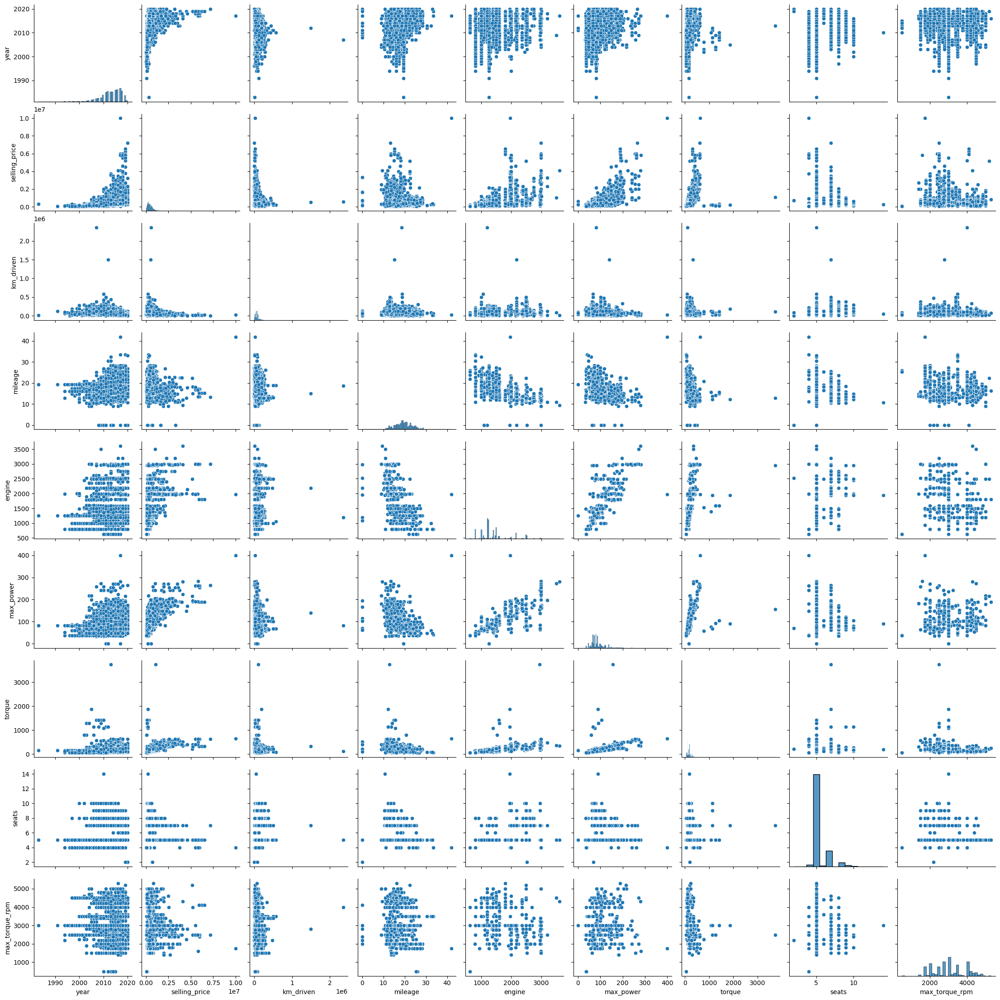

In [39]:
# your code here
%matplotlib inline
sns.pairplot(df_train)

# year, km_driven, mileage, engine, max_power, torque, 

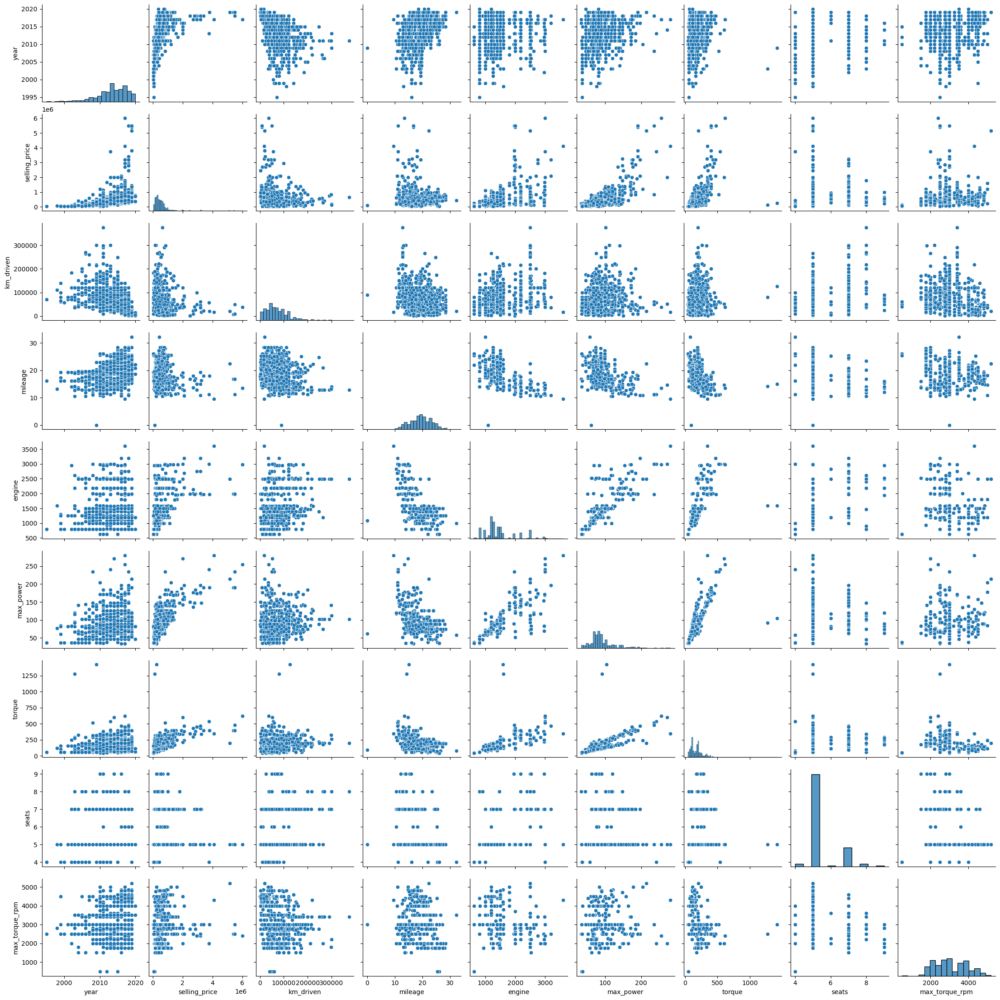

In [40]:
sns.pairplot(df_test)

**Ответ:**
1. Визуально прослеживается зависимость с `max_power, engine, year, torque`
2. Визуально, видна корреляция между `max_power и engine, engine и torque, torque и max_power`
3. Распределения схожи в train и test


### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [41]:
df_train.select_dtypes(include=['number']).corr()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.156858,0.048262,0.041178,0.061325
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692814,0.433124,0.149953,-0.084534
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024588,0.106602,0.192328,-0.207334
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.373390,-0.226219,-0.451059,-0.190020
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681117,0.566066,0.652172,-0.241373
max_power,0.156858,0.692814,0.024588,-0.373390,0.681117,1.000000,0.616197,0.244112,-0.021114
torque,0.048262,0.433124,0.106602,-0.226219,0.566066,0.616197,1.000000,0.298097,-0.320456
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.244112,0.298097,1.000000,-0.200382
max_torque_rpm,0.061325,-0.084534,-0.207334,-0.190020,-0.241373,-0.021114,-0.320456,-0.200382,1.000000


<AxesSubplot:>

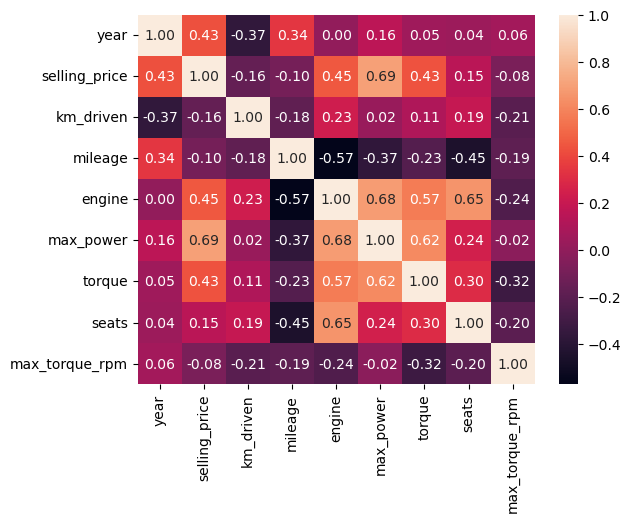

In [42]:
sns.heatmap(df_train.select_dtypes(include=['number']).corr(), annot=True, fmt=".2f")

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

**Ответ**
- `engine и year` - околонулевая корреляция
- Сильная положительная связь между `selling_price и max_power, max_power и engine, torque и max_power, seats и engine`
- Между признаками есть обратная корреляция, пусть и не очень сильная, тем не менее - да, можно так сказать
- По умолчанию Пирсон, есть также Кендалл и Спирмен


### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [43]:
# https://wiki.loginom.ru/articles/rank-correlation-spearman.html

# первый вариант - корректный только если все числа различные
def spearman(x, y):
    # чек на корректность 
    if len(x) != len(y):
        raise ValueError("Массивы должны иметь одинаковую длину")
    
    x = np.array(x)
    y = np.array(y)

    n = len(x)

    # вычисляем ранги
    rank_x = np.argsort(np.argsort(x)) + 1
    rank_y = np.argsort(np.argsort(y)) + 1
    sum_d_squared = np.sum((rank_x - rank_y)**2) # сумма квадратов разности рангов 

    # итоговое значение корреляции
    rho = 1 - (6 * sum_d_squared) / (n * (n**2 - 1)) 
    return rho


def spearman_2(x, y):
    # чек на корректность 
    if len(x) != len(y):
        raise ValueError("Массивы должны иметь одинаковую длину")
    
    x = np.array(x)
    y = np.array(y)
    

    # P.S. код функции любезно взят у LLM и немного отредактирован
    def rank_with_ties(arr):
        # Сортируем массив и получаем индексы
        sorted_indices = np.argsort(arr)
        sorted_arr = arr[sorted_indices]
        
        # Присваиваем начальные ранги
        ranks = np.arange(1, len(arr) + 1)
        
        # Обрабатываем связи
        unique_vals, counts = np.unique(sorted_arr, return_counts=True)
        
        current_index = 0
        
        for count in counts:
            if count > 1:
                # Для связных значений используем средний ранг
                tie_rank = np.mean(ranks[current_index:current_index + count])
                ranks[current_index:current_index + count] = tie_rank
            current_index += count
        
        # Возвращаем ранги в исходном порядке
        result = np.empty_like(ranks)
        result[sorted_indices] = ranks
        return result
    
    rank_x = rank_with_ties(x)
    rank_y = rank_with_ties(y)
    
    # Корреляция Пирсона между рангами
    covariance = np.cov(rank_x, rank_y)[0, 1]
    std_x = np.std(rank_x, ddof=1)
    std_y = np.std(rank_y, ddof=1)
    
    spearman_rho = covariance / (std_x * std_y)
    
    return spearman_rho
    

In [44]:
spearman(df_train['year'], df_train['km_driven'])

-0.5662181285955705

In [45]:
# уточнённая функция
spearman_2(df_train['year'], df_train['km_driven'])

-0.5696575905387022

In [46]:
df_train.select_dtypes(include=['number']).corr('spearman')

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.165798,0.102603,0.048291,0.072347
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612258,0.582414,0.317605,-0.134622
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040919,0.242934,0.195317,-0.310240
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308824,-0.162381,-0.435458,-0.183488
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713113,0.842430,0.527716,-0.368109
max_power,0.165798,0.612258,0.040919,-0.308824,0.713113,1.000000,0.779600,0.304857,-0.045339
torque,0.102603,0.582414,0.242934,-0.162381,0.842430,0.779600,1.000000,0.438233,-0.535816
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304857,0.438233,1.000000,-0.192524
max_torque_rpm,0.072347,-0.134622,-0.310240,-0.183488,-0.368109,-0.045339,-0.535816,-0.192524,1.000000


<AxesSubplot:>

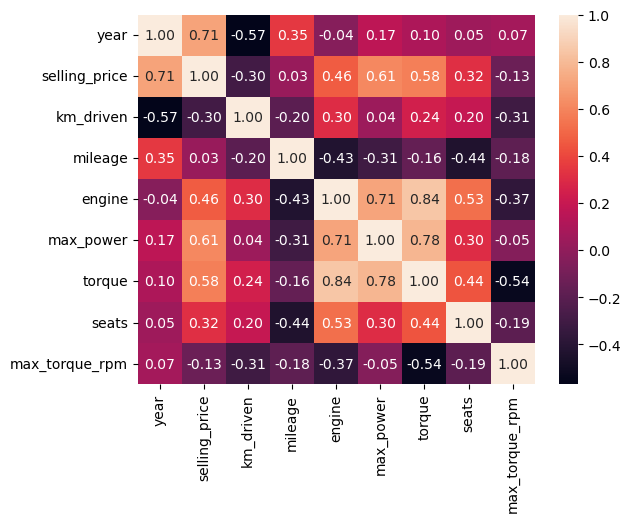

In [47]:
sns.heatmap(df_train.select_dtypes(include=['number']).corr('spearman'), annot=True, fmt=".2f")

In [48]:
import phik

df_train.phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/Users/vadim/opt/anaconda3/lib/python3.9/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
name,1.000000,0.948995,0.994871,0.000000,1.000000,0.799127,1.000000,0.830098,0.999690,1.000000,0.997906,1.000000,0.999985,0.999928
year,0.948995,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636,0.279253,0.213156,0.381639,0.096307,0.288178,0.328420
selling_price,0.994871,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641,0.649768,0.503682,0.872166,0.423431,0.196447,0.225402
km_driven,0.000000,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887,0.081625,0.210747,0.000000,0.000000,0.096223,0.096129
fuel,1.000000,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943,0.582304,0.644421,0.236006,0.085412,0.450714,0.674029
seller_type,0.799127,0.232412,0.334505,0.000000,0.050771,1.000000,0.127968,0.176612,0.064736,0.160346,0.331904,0.074575,0.032173,0.118025
transmission,1.000000,0.153714,0.463058,0.012824,0.053721,0.127968,1.000000,0.096990,0.331889,0.520161,0.511877,0.404678,0.045734,0.189205
owner,0.830098,0.418636,0.557641,0.087887,0.030943,0.176612,0.096990,1.000000,0.152406,0.186011,0.121438,0.039605,0.046741,0.242367
mileage,0.999690,0.279253,0.649768,0.081625,0.582304,0.064736,0.331889,0.152406,1.000000,0.588155,0.687235,0.204598,0.679979,0.389414
engine,1.000000,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011,0.588155,1.000000,0.720780,0.466097,0.603400,0.731416


interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/Users/vadim/opt/anaconda3/lib/python3.9/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


<AxesSubplot:>

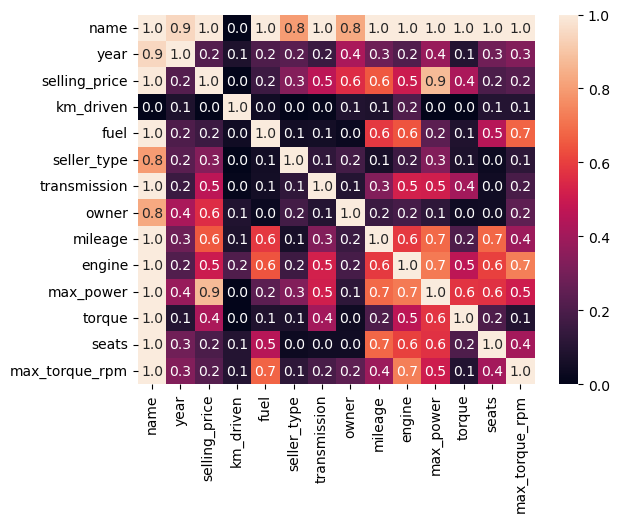

In [49]:
sns.heatmap(df_train.phik_matrix(), annot=True, fmt=".1f")

In [50]:
df_train.shape, df_train.name.nunique()

((5840, 14), 1924)

**Вывод**

Вначале получил немного не такой ответ и задумался, почему отличается в 3 знаке после запятой, и выяснил, что расчёт немного иначе работает при повторяющихся значениях. Некоторые корреляции получаются выше (например между ценой и годом) - в данных есть нелинейные зависимости

Phik-корреляция показала значения около 1 с переменной name - после гугления выяснил, что phik может давать такие артефакты, когда одна переменная имеет намного больше категорий чем другие. В остальном - видим корреляцию некоторых категориальных и непрерывных переменных (например, fuel с mileage, engine, seats, max_torque_rpm). С целевой переменной коррелируют категориальные transmission, owner. Сильную корреляцию таргета phik "видит" с max_power. 

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

In [51]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5840 non-null   float64
 9   engine          5840 non-null   int64  
 10  max_power       5840 non-null   float64
 11  torque          5840 non-null   float64
 12  seats           5840 non-null   int64  
 13  max_torque_rpm  5840 non-null   float64
dtypes: float64(4), int64(5), object(5)
memory usage: 638.9+ KB


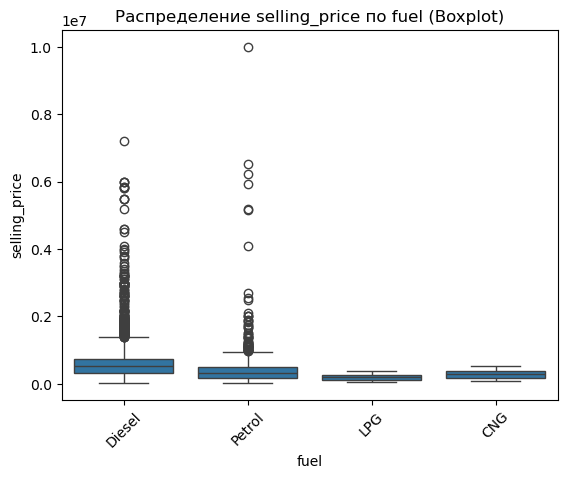

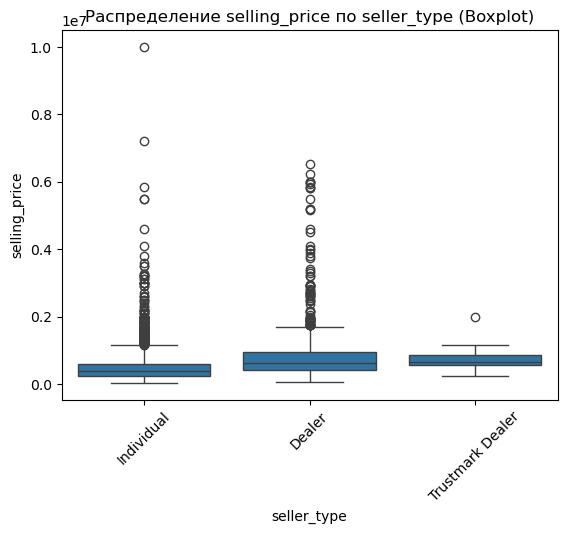

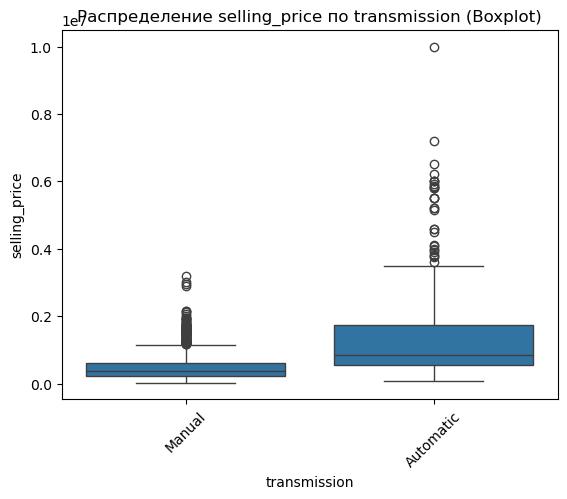

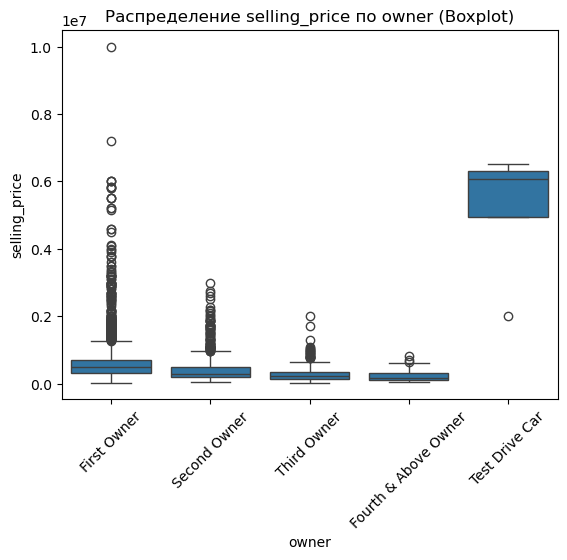

In [52]:
# your code here

# исследуем зависимость категориальных и целевой переменной на графиках

for col in df_train.drop('name', axis=1).select_dtypes(include=['object']).columns:
    sns.boxplot(x=col, y='selling_price', data=df_train)
    plt.title(f'Распределение selling_price по {col} (Boxplot)')
    plt.xticks(rotation=45)
    plt.show()

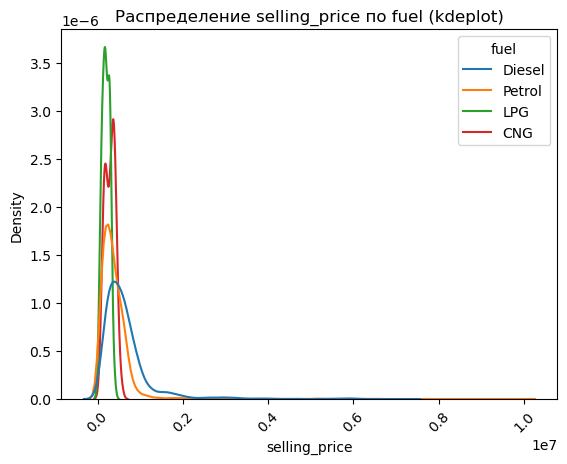

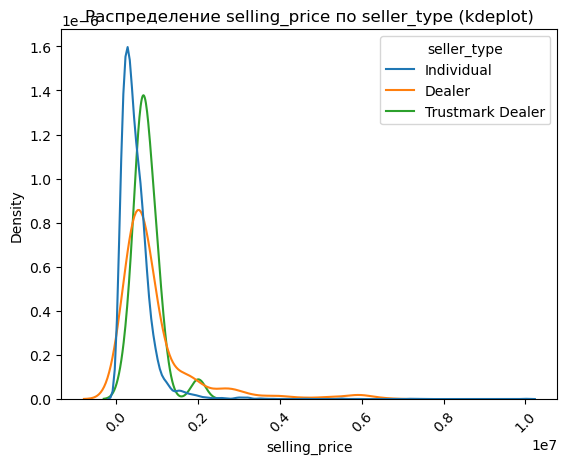

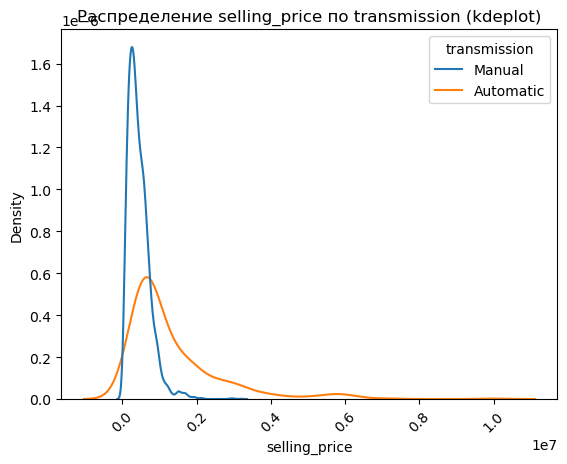

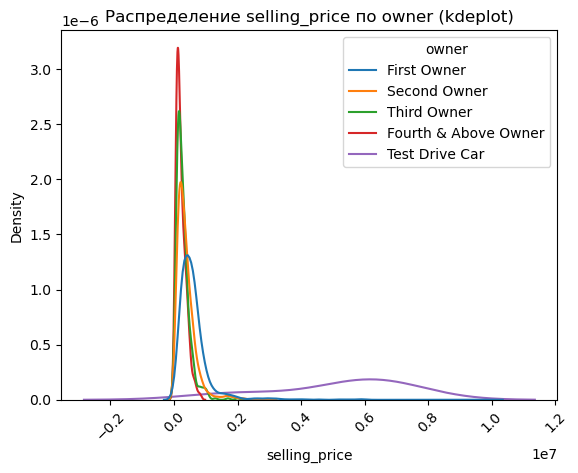

In [53]:
for col in df_train.drop('name', axis=1).select_dtypes(include=['object']).columns:
    sns.kdeplot(x='selling_price', hue=col, common_norm=False, data=df_train)
    plt.title(f'Распределение selling_price по {col} (kdeplot)')
    plt.xticks(rotation=45)
    plt.show()

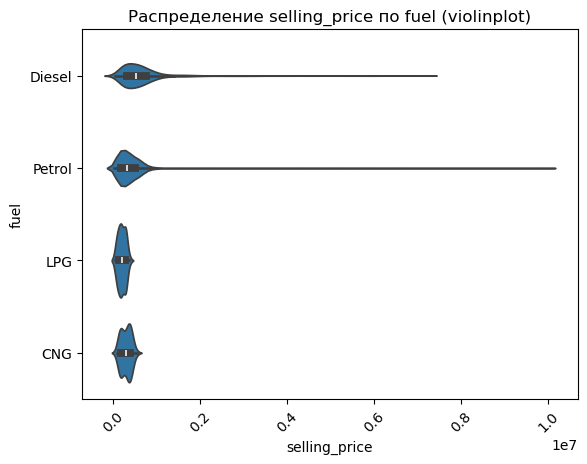

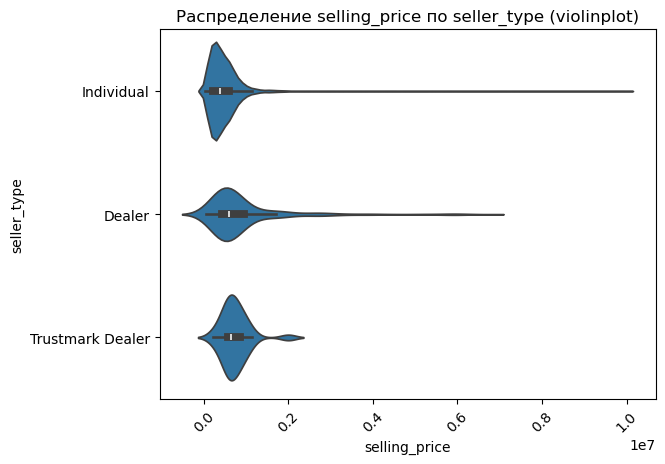

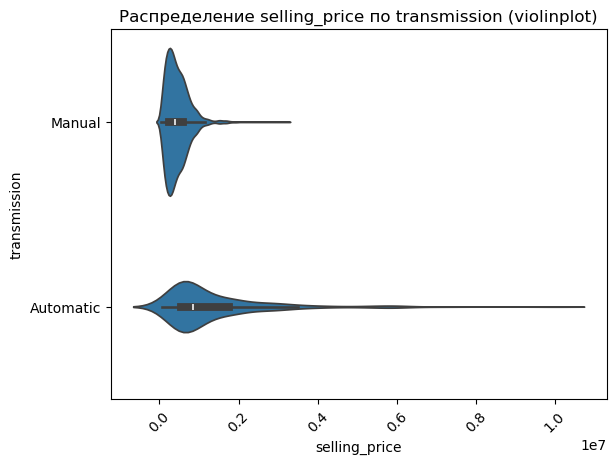

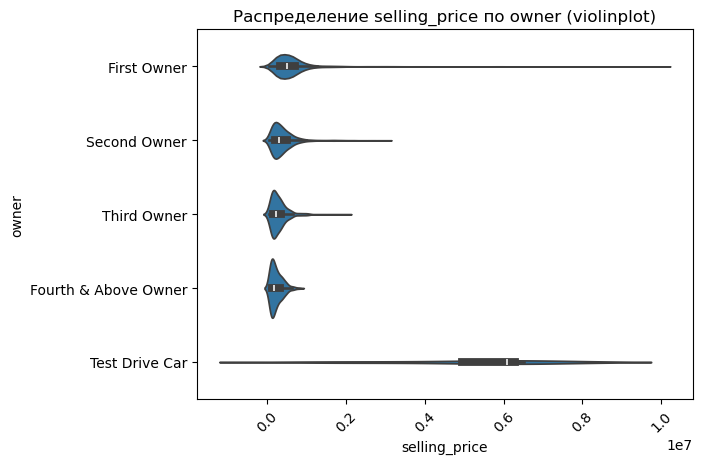

In [54]:
for col in df_train.drop('name', axis=1).select_dtypes(include=['object']).columns:
    sns.violinplot(x='selling_price', y=col, data=df_train)
    plt.title(f'Распределение selling_price по {col} (violinplot)')
    plt.xticks(rotation=45)
    plt.show()

**Коммент**
- Удобнее сравнивать влияние категориальной переменной на целевую через боксплоты, оценки плотности распределений или комбо двух методов - скрипичный график (violinplot) относительно pairplot'а. Видно, что машины на автомате, тест-драйвные и дилерские - дороже относительно других. 

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [55]:
df_train_num = df_train.select_dtypes(include=['number']).copy()
df_train_num.head()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2014,450000,145500,23.40,1248,74.00,190.000000,5,2000.0
1,2014,370000,120000,21.14,1498,103.52,250.000000,5,2500.0
2,2010,225000,127000,23.00,1396,90.00,219.668960,5,2750.0
3,2007,130000,120000,16.10,1298,88.20,112.776475,5,3000.0
4,2017,440000,45000,20.14,1197,81.86,113.750000,5,4000.0


In [56]:
df_test_num = df_test.select_dtypes(include=['number']).copy()
df_test_num.head()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2010,229999,168000,14.0,2498,112.0,260.0,7,2200.0
1,2017,665000,25000,21.5,1497,108.5,260.0,5,2750.0
2,2007,175000,218463,12.9,1799,130.0,172.0,5,4300.0
3,2015,635000,173000,25.1,1498,98.6,200.0,5,1750.0
4,2011,130000,70000,16.5,1172,65.0,96.0,5,3000.0


In [57]:
y_train_full = df_train['selling_price'] # your code here
X_train_full = df_train.drop('selling_price', axis=1) # your code here

y_test_full = df_test['selling_price'] # your code here
X_test_full = df_test.drop('selling_price', axis=1) # your code here

X_train_full.head()

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.000000,5,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.000000,5,2500.0
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.668960,5,2750.0
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.776475,5,3000.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.750000,5,4000.0


In [58]:
y_train = df_train_num['selling_price'] # your code here
X_train = df_train_num.drop('selling_price', axis=1) # your code here

- year - год выпуска авто
- km_driven - пробег в км
- mileage - расход топлива
- engine - объем двигателя (скорее всего в куб. см)
- max_power - мощность (BHP (Brake Horsepower) в автомобилях означает тормозную мощность)
- torque - крутящий момент в Нм
- seats - мест в машине
- max_torque_rpm - макс. число оборотов в минуту

In [59]:
y_test = df_test_num['selling_price'] # your code here
X_test = df_test_num.drop('selling_price', axis=1) # your code here

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [60]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

def mse_r2_print(y_train, pred_y_train, y_test, pred_y_test):
    print(f'train MSE={MSE(y_train, pred_y_train)}, test MSE={MSE(y_test, pred_y_test)}')
    print(f'train r2_score={r2_score(y_train, pred_y_train)}, test r2_score={r2_score(y_test, pred_y_test)}')

model = LinearRegression()
model.fit(X_train, y_train)

pred_y_train = model.predict(X_train)
pred_y_test = model.predict(X_test)

mse_r2_print(y_train, pred_y_train, y_test, pred_y_test)

train MSE=114357542199.20885, test MSE=229747918289.33743
train r2_score=0.6010389159581786, test r2_score=0.6003192325159221


**Выводы**
- Получили +-схожий порядок метрик на трейне и тесте. Тем не менее, R2 около 0.6 означает, что мы объясняем лишь 60% изменчивости в данных

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [61]:
def r2_handmade(y_true_, y_pred_):
    return 1 - sum((y_true_ - y_pred_)**2) / sum((y_true_ - y_true_.mean())**2)

print(f'train r2_handmade={r2_handmade(y_train, pred_y_train)}, test r2_handmade={r2_handmade(y_test, pred_y_test)}')

train r2_handmade=0.6010389159581793, test r2_handmade=0.6003192325159217


$R^2 = 1 - \frac{SS_{res}}{SS_{tot}}$

- $SS_{res} = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$ - сумма квадратов ошибок (Residual Sum of Squares), измеряет ошибку, которую совершает модель
- $SS_{tot} = \sum_{i=1}^{n} (y_i - \bar{y})^2$ - общаяя сумма квадратов (Total Sum of Squares), измеряет общую вариативность (разброс) целевой переменной y вокруг своего среднего значения $\bar{y}$. Показывает, насколько хорошо самая простая модель (модель, которая всегда предсказывает среднее значение $\bar{y}$) описывает данные. Бейзлайн ошибки, с которым сравнивается модель.

Дробь $\frac{SS_{res}}{SS_{tot}}$ представляет собой долю дисперсии, которую наша модель НЕ смогла объяснить. Вычитая из 1 дробь - получаем коэф. детерминации, или долю объясненной дисперсии. 





### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [62]:
X_train.shape

(5840, 8)

In [63]:
# your code here
def adjusted_r2_handmade(y_true, y_pred, n_features):
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    n_samples = len(y_true)
    
    r2 = r2_handmade(y_true, y_pred)
    
    adj_r2 = 1 - (1 - r2) * (n_samples - 1) / (n_samples - n_features - 1)
    
    return adj_r2


print(f'train adjusted_r2_handmade={adjusted_r2_handmade(y_train, pred_y_train, X_train.shape[1])},'\
      +'test adjusted_r2_handmade={adjusted_r2_handmade(y_test, pred_y_test, X_test.shape[1])}')

train adjusted_r2_handmade=0.6004915503824059,test adjusted_r2_handmade={adjusted_r2_handmade(y_test, pred_y_test, X_test.shape[1])}


Идейно - метрика "штрафует" модель за добавление бесполезных признаков и может уменьшаться при добавлении признаков, которые не улучшают модель достаточно.

$R^2_{adj} = 1 - (1 - R^2) \times \frac{n - 1}{n - p - 1}$

$R^2_{adj} = 1 - \frac{SS_{res}/(n - p - 1)}{SS_{tot}/(n - 1)}$

- $R^2$ - обычный коэффициент детерминации
- $n$ - количество наблюдений (sample size)
- $p$ - количество признаков (features) в модели

Можем использовать метрику при сравнении моделей с разным количеством признаков для выбора между простой и сложной моделью

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [64]:
from sklearn.preprocessing import StandardScaler

# your code here

scaler = StandardScaler()
scaler.fit(X_train)

X_train_tr = scaler.transform(X_train)
X_test_tr = scaler.transform(X_test)

model_tr = LinearRegression()
model_tr.fit(X_train_tr, y_train)

pred_y_train_tr = model_tr.predict(X_train_tr)
pred_y_test_tr = model_tr.predict(X_test_tr)

mse_r2_print(y_train, pred_y_train_tr, y_test, pred_y_test_tr)

train MSE=114357542199.2092, test MSE=229747918289.32925
train r2_score=0.6010389159581773, test r2_score=0.6003192325159363


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [65]:
# your code here

pd.DataFrame(model_tr.coef_.reshape(1, -1), columns=X_train.columns).T.sort_values(by=0, ascending=False)

,0
max_power,334291.836561
year,166546.155663
engine,24102.358217
torque,-3461.969085
mileage,-9211.853483
seats,-29964.640711
km_driven,-48869.891369
max_torque_rpm,-61592.425086


**Ответ:** max_power оказался самым информативным признаком

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [66]:
from sklearn.linear_model import Lasso

model_lasso = Lasso(random_state=42)
model_lasso.fit(X_train_tr, y_train)

pred_y_train_lasso_tr = model_lasso.predict(X_train_tr)
pred_y_test_lasso_tr = model_lasso.predict(X_test_tr)

mse_r2_print(y_train, pred_y_train_tr, y_test, pred_y_test_tr)

train MSE=114357542199.2092, test MSE=229747918289.32925
train r2_score=0.6010389159581773, test r2_score=0.6003192325159363


In [67]:
pd.DataFrame(model_lasso.coef_.reshape(1, -1), columns=X_train.columns).T.sort_values(by=0, ascending=False)

,0
max_power,334291.048821
year,166544.007896
engine,24099.814867
torque,-3458.412071
mileage,-9208.577305
seats,-29960.825497
km_driven,-48868.926784
max_torque_rpm,-61589.197004


**Ответ:** модель не занулила веса - скорее всего, слишком слабый коэф. регурялизации. 

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [68]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'alpha': np.linspace(0.0001, 10000, 10000),  # ограничение на веса
    'max_iter': [1000, 5000], # предел количества шагов, которые алгоритм может сделать, пытаясь найти наилучшие веса 
}

grid_search = GridSearchCV(
    Lasso(random_state=42),
    param_grid,
    cv=10,
    n_jobs=-1,
    verbose=1,
    scoring='neg_mean_squared_error'
)

grid_search.fit(X_train_tr, y_train)

-grid_search.best_score_, grid_search.best_estimator_, grid_search.best_params_

Fitting 10 folds for each of 20000 candidates, totalling 200000 fits


(119070430197.38345,
 Lasso(alpha=3680.3681, random_state=42),
 {'alpha': 3680.3681, 'max_iter': 1000})

In [69]:
lasso_cv = grid_search.best_estimator_

pd.DataFrame(lasso_cv.coef_.reshape(1, -1), columns=X_train.columns).T.sort_values(by=0, ascending=False)

,0
max_power,336113.259368
year,159546.485648
engine,14779.594902
mileage,-0.000000
torque,0.000000
seats,-16272.869911
km_driven,-45294.265028
max_torque_rpm,-53349.826537


In [70]:
pred_y_train_lasso_tr_cv = lasso_cv.predict(X_train_tr)
pred_y_test_lasso_tr_cv = lasso_cv.predict(X_test_tr)

mse_r2_print(y_train, pred_y_train_lasso_tr_cv, y_test, pred_y_test_lasso_tr_cv)

train MSE=114521360008.0988, test MSE=232608404586.99847
train r2_score=0.6004674020084799, test r2_score=0.595342990000475


**Выводы**

Обучилось 200000 моделей, перебирал:
- alpha - коэффцициент l1-регуляризации, лучшее значение alpha=3680.3681 занулили mileage и torque
- max_iter - предел количества шагов, которые алгоритм может сделать, пытаясь найти наилучшие веса, лучшее max_iter=1000

Однако, как ни странно, качество упало

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [71]:
from sklearn.linear_model import ElasticNet

param_grid2 = {
    'alpha': np.linspace(1, 10000, 1000),  # ограничение на веса
    'max_iter': [1000, 10000], # предел количества шагов, которые алгоритм может сделать, пытаясь найти наилучшие веса 
    'l1_ratio': [0.25, 0.5, 0.75] # соотношение регуляризаторов
}

gc2 = GridSearchCV(
    ElasticNet(random_state=42),
    param_grid2,
    cv=10,
    n_jobs=-1,
    verbose=1,
    scoring='neg_mean_squared_error'
)

gc2.fit(X_train_tr, y_train)

-gc2.best_score_, gc2.best_estimator_, gc2.best_params_

Fitting 10 folds for each of 6000 candidates, totalling 60000 fits


(124607721086.6209,
 ElasticNet(l1_ratio=0.75, random_state=42),
 {'alpha': 1.0, 'l1_ratio': 0.75, 'max_iter': 1000})

In [72]:
enet_cv = gc2.best_estimator_

pd.DataFrame(enet_cv.coef_.reshape(1, -1), columns=X_train.columns).T.sort_values(by=0, ascending=False)

,0
max_power,229372.764353
year,139187.629883
engine,66226.799526
torque,40702.969356
mileage,2743.418315
seats,-25192.136447
max_torque_rpm,-27854.023361
km_driven,-50013.205634


In [73]:
pred_y_train_enet_tr_cv = enet_cv.predict(X_train_tr)
pred_y_test_enet_tr_cv = enet_cv.predict(X_test_tr)

mse_r2_print(y_train, pred_y_train_enet_tr_cv, y_test, pred_y_test_enet_tr_cv)

train MSE=120421629026.40923, test MSE=260832478862.6352
train r2_score=0.5798830340829879, test r2_score=0.5462430035805431


**Ответ**

Обучили 60000 моделей. Параметры лучшей `{'alpha': 1.0, 'l1_ratio': 0.75, 'max_iter': 1000})`. Качество ухудшилось :(

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [74]:
# your code here

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [78]:
# выделим марку и модель
X_train_cat = X_train_full.copy()
X_train_cat[['brand', 'model']] = X_train_full['name'].str.split(' ', expand=True)[[0, 1]]
X_train_cat = X_train_cat.drop('name', axis=1)
# X_train_cat['name'] = X_train_full['name'].str.split(' ', expand=True)[0]
X_train_cat['seats'] = X_train_cat['seats'].astype('category')

X_test_cat = X_test_full.copy()
X_test_cat[['brand', 'model']] = X_test_full['name'].str.split(' ', expand=True)[[0, 1]]
X_test_cat = X_test_cat.drop('name', axis=1)
# X_test_cat['name'] = X_test_full['name'].str.split(' ', expand=True)[0]
X_test_cat['seats'] = X_test_cat['seats'].astype('category')

X_train_cat

,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,brand,model
0,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.000000,5,2000.0,Maruti,Swift
1,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.000000,5,2500.0,Skoda,Rapid
2,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.668960,5,2750.0,Hyundai,i20
3,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.776475,5,3000.0,Maruti,Swift
4,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.750000,5,4000.0,Hyundai,Xcent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.100000,5,3000.0,Hyundai,Santro
5836,2013,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.000000,5,3500.0,Maruti,Wagon
5837,2013,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.700000,5,4000.0,Hyundai,i20
5838,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.359600,5,3000.0,Hyundai,Verna


In [79]:
X_train_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   year            5840 non-null   int64   
 1   km_driven       5840 non-null   int64   
 2   fuel            5840 non-null   object  
 3   seller_type     5840 non-null   object  
 4   transmission    5840 non-null   object  
 5   owner           5840 non-null   object  
 6   mileage         5840 non-null   float64 
 7   engine          5840 non-null   int64   
 8   max_power       5840 non-null   float64 
 9   torque          5840 non-null   float64 
 10  seats           5840 non-null   category
 11  max_torque_rpm  5840 non-null   float64 
 12  brand           5840 non-null   object  
 13  model           5840 non-null   object  
dtypes: category(1), float64(4), int64(3), object(6)
memory usage: 599.3+ KB


In [80]:
assert X_train_cat.shape == (5840, 11) # не понимаю, почему 11 должно-то быть

AssertionError: 

In [81]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,brand,model
count,5840,5840,5840,5840,5840,5840
unique,4,3,2,5,30,202
top,Diesel,Individual,Manual,First Owner,Maruti,Swift
freq,3177,5223,5336,3603,1804,558


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [82]:
X_train_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   year            5840 non-null   int64   
 1   km_driven       5840 non-null   int64   
 2   fuel            5840 non-null   object  
 3   seller_type     5840 non-null   object  
 4   transmission    5840 non-null   object  
 5   owner           5840 non-null   object  
 6   mileage         5840 non-null   float64 
 7   engine          5840 non-null   int64   
 8   max_power       5840 non-null   float64 
 9   torque          5840 non-null   float64 
 10  seats           5840 non-null   category
 11  max_torque_rpm  5840 non-null   float64 
 12  brand           5840 non-null   object  
 13  model           5840 non-null   object  
dtypes: category(1), float64(4), int64(3), object(6)
memory usage: 599.3+ KB


In [83]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

ohe = OneHotEncoder(handle_unknown='ignore').fit(X_train_cat)

X_train_cat_ohe = ohe.transform(X_train_cat)
X_test_cat_ohe = ohe.transform(X_test_cat)

X_train_cat_ohe

# ohe.get_feature_names()

<5840x2207 sparse matrix of type '<class 'numpy.float64'>'
	with 81760 stored elements in Compressed Sparse Row format>

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

- Алгоритм OHE должен быть "обучен" исключительно на тренировочном наборе данных. Также нужно учесть, что каких-то категорий может не оказаться в тестовом наборе.
- Удаление одного столбца необходимо для устранения проблемы полной мультиколлинеарности - когда между фичами существует строгая линейная зависимость,  и для любого наблюдения сумма всех этих фичей будет 1
- Нет, это некорректно. OHE создает из одного категориального признака единый набор бинарных признаков, и этот набор представляет собой исходную категорию. Удаление части столбцов из этого набора нарушает целостность и логику.



### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [84]:
X_train_cat_ohe

<5840x2207 sparse matrix of type '<class 'numpy.float64'>'
	with 81760 stored elements in Compressed Sparse Row format>

In [85]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# your code here

param_grid = {
    'alpha': np.linspace(0.0001, 10000, 1000),  # ограничение на веса
    'max_iter': [1000, 5000], # предел количества шагов, которые алгоритм может сделать, пытаясь найти наилучшие веса 
}

grid_search = GridSearchCV(
    Ridge(random_state=42),
    param_grid,
    cv=10,
    n_jobs=-1,
    verbose=1,
    scoring='r2'
)

grid_search.fit(X_train_cat_ohe, y_train)

grid_search.best_score_, grid_search.best_estimator_, grid_search.best_params_


Fitting 10 folds for each of 2000 candidates, totalling 20000 fits


(0.7994842281043109,
 Ridge(alpha=0.0001, max_iter=1000, random_state=42),
 {'alpha': 0.0001, 'max_iter': 1000})

In [86]:
ridge_cv = grid_search.best_estimator_

In [87]:
pred_y_train_ridge_cv = ridge_cv.predict(X_train_cat_ohe)
pred_y_test_ridge_cv = ridge_cv.predict(X_test_cat_ohe)

mse_r2_print(y_train, pred_y_train_ridge_cv, y_test, pred_y_test_ridge_cv)



train MSE=7746273433.465304, test MSE=33526228094.68071
train r2_score=0.9729754453718833, test r2_score=0.9416761262713469


**Вывод:** значительно улучшилось качество, причем без применения скейлеров

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [90]:
# your code here

# OHE для категорий, скейлер для численных
# генерим признаки умножением/делением
# делаем лог таргета
# бакетизация признаков?
# дамми для заполненных медианой
# полиномиальные признаки?

X_train_final = X_train_full.copy()
X_test_final = X_test_full.copy()
X_train_final

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.000000,5,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.000000,5,2500.0
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.668960,5,2750.0
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.776475,5,3000.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.750000,5,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.100000,5,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.000000,5,3500.0
5837,Hyundai i20 Magna,2013,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.700000,5,4000.0
5838,Hyundai Verna CRDi SX,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.359600,5,3000.0


In [91]:
X_test_final

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,168000,Diesel,Individual,Manual,First Owner,14.00,2498,112.00,260.00000,7,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,25000,Diesel,Individual,Manual,First Owner,21.50,1497,108.50,260.00000,5,2750.0
2,Honda Civic 1.8 S AT,2007,218463,Petrol,Individual,Automatic,First Owner,12.90,1799,130.00,172.00000,5,4300.0
3,Honda City i DTEC VX,2015,173000,Diesel,Individual,Manual,First Owner,25.10,1498,98.60,200.00000,5,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,70000,Petrol,Individual,Manual,Second Owner,16.50,1172,65.00,96.00000,5,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,100000,Petrol,Individual,Manual,Second Owner,19.81,1086,68.05,99.04000,5,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,50000,Petrol,Individual,Manual,Second Owner,18.60,1197,81.83,114.70000,5,4000.0
997,Hyundai i20 Era Diesel,2009,40000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.66896,5,2750.0
998,Hyundai i10 Asta,2012,25000,Petrol,Individual,Manual,First Owner,20.36,1197,78.90,111.80000,5,4000.0


In [92]:
# выделяем из name фичи
X_train_final[['brand', 'model']] = X_train_full['name'].str.split(' ', expand=True)[[0, 1]]
X_train_final = X_train_final.drop('name', axis=1)
X_train_final['seats'] = X_train_final['seats'].astype('category')

X_test_final[['brand', 'model']] = X_test_full['name'].str.split(' ', expand=True)[[0, 1]]
X_test_final = X_test_final.drop('name', axis=1)
X_test_final['seats'] = X_test_final['seats'].astype('category')

X_train_final['power_per_liter'] = X_train_final['max_power'] / X_train_final['engine'] / 1000  # лошади на литр объема
X_train_final['km_per_year'] = X_train_final['km_driven'] / (2025 - X_train_final['year'])  # средний пробег за год
X_test_final['power_per_liter'] = X_test_final['max_power'] / X_test_final['engine'] / 1000  # лошади на литр объема
X_test_final['km_per_year'] = X_test_final['km_driven'] / (2025 - X_test_final['year'])  # средний пробег за год

X_train_final

,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,brand,model,power_per_liter,km_per_year
0,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.000000,5,2000.0,Maruti,Swift,0.000059,13227.272727
1,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.000000,5,2500.0,Skoda,Rapid,0.000069,10909.090909
2,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.668960,5,2750.0,Hyundai,i20,0.000064,8466.666667
3,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.776475,5,3000.0,Maruti,Swift,0.000068,6666.666667
4,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.750000,5,4000.0,Hyundai,Xcent,0.000068,5625.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.100000,5,3000.0,Hyundai,Santro,0.000057,11235.294118
5836,2013,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.000000,5,3500.0,Maruti,Wagon,0.000067,4166.666667
5837,2013,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.700000,5,4000.0,Hyundai,i20,0.000069,9166.666667
5838,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.359600,5,3000.0,Hyundai,Verna,0.000074,6611.111111


In [93]:
X_train_final.to_csv('X_train_final.csv')
X_test_final.to_csv('X_test_final.csv')
y_train.to_csv('y_train.csv')
y_test.to_csv('y_test.csv')

<AxesSubplot:xlabel='selling_price', ylabel='Density'>

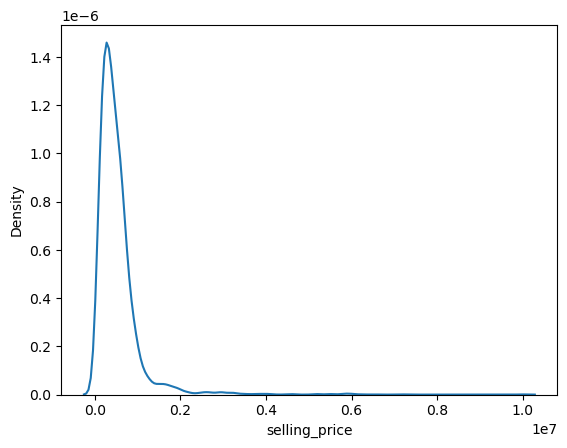

In [94]:
# глядя на pairplot - хочется прологарифмировать некоторые признаки, проверим таргет:
sns.kdeplot(data=y_train) # явно стоит логарифмировать

In [95]:
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import numpy as np

# для логарифмирования с обработкой неположительных значений
def safe_log(x):
    return np.log(np.where(x > 0, x, 1))  # заменяем неположительные значения на 1
log_features = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque']

log_transformer = FunctionTransformer(safe_log)
cat_features_mask = (X_train_final.dtypes == "object").values

# числовые признаки без логарифмирования 
other_numeric_features = [col for col in X_train_final.columns[~cat_features_mask] 
                         if col not in log_features]

# для признаков, требующих логарифмирования
log_pipeline = Pipeline([
    ('log', log_transformer),
    ('scaler', StandardScaler())
    , ('poly', PolynomialFeatures(degree=2, include_bias=False))
])

# для остальных числовых признаков
numeric_pipeline = Pipeline([
    ('scaler', StandardScaler())
    , ('poly', PolynomialFeatures(degree=2, include_bias=False))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('log_features', log_pipeline, log_features),
        ('other_num', numeric_pipeline, other_numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), X_train_final.columns[cat_features_mask])
    ]
)

# пайплайн с регрессией
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge(alpha=0.0001))
])

In [114]:
X_test_final.head()

,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,brand,model,power_per_liter,km_per_year
0,2010,168000,Diesel,Individual,Manual,First Owner,14.0,2498,112.0,260.0,7,2200.0,Mahindra,Xylo,0.000045,11200.000000
1,2017,25000,Diesel,Individual,Manual,First Owner,21.5,1497,108.5,260.0,5,2750.0,Tata,Nexon,0.000072,3125.000000
2,2007,218463,Petrol,Individual,Automatic,First Owner,12.9,1799,130.0,172.0,5,4300.0,Honda,Civic,0.000072,12136.833333
3,2015,173000,Diesel,Individual,Manual,First Owner,25.1,1498,98.6,200.0,5,1750.0,Honda,City,0.000066,17300.000000
4,2011,70000,Petrol,Individual,Manual,Second Owner,16.5,1172,65.0,96.0,5,3000.0,Tata,Indica,0.000055,5000.000000


In [123]:
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

pipeline.fit(X_train_final, y_train_log)

# предсказываем и делаем обратное преобразование
y_train_pred_log_final = pipeline.predict(X_train_final)
y_test_pred_log_final = pipeline.predict(X_test_final)

y_train_pred_final = np.exp(y_train_pred_log_final)
y_test_pred_final = np.exp(y_test_pred_log_final)

mse_r2_print(y_train, y_train_pred_final, y_test, y_test_pred_final)

train MSE=13494008970.321453, test MSE=31242515172.727623
train r2_score=0.9529232235728589, test r2_score=0.9456489854822409


In [124]:
# топ-10 весов
sorted(pipeline['regressor'].coef_, key=abs)[:len(pipeline['regressor'].coef_) - 10:-1]

[1.4535871513408045,
 -1.4050429019151947,
 1.1546404597113695,
 0.8407948896566949,
 0.7628220859782605,
 0.6904725350742491,
 0.6857559307858523,
 -0.6586300109619218,
 0.6411534188911305]

**Итого:** нагенерил новые фичи (из существующих, и полиномиальных), попробовал часть из них прологарифмировать, прологарифмировал также таргет (чтобы получить более адекватное распределение), и воспользовался OHE и скейлером - результаты получились неплохие, на тесте чуть-чуть получше, чем на прошлой Ridge.

In [128]:
# Встал вопрос - а как весам присвоить исходные имена?
# Спросил у дипсика, и получил такое

# Обучаем пайплайн
pipeline.fit(X_train_final, y_train_log)

# Способ 1: Получить названия признаков после всех преобразований
# Создаем временный трансформер для получения названий признаков
preprocessor_temp = preprocessor.fit(X_train_final)
feature_names = []

# Получаем названия для log_features
log_pipeline_temp = log_pipeline.fit(X_train_final[log_features])
log_feature_names = log_pipeline_temp.named_steps['poly'].get_feature_names_out(log_features)
feature_names.extend(log_feature_names)

# Получаем названия для other_numeric_features
numeric_pipeline_temp = numeric_pipeline.fit(X_train_final[other_numeric_features])
other_feature_names = numeric_pipeline_temp.named_steps['poly'].get_feature_names_out(other_numeric_features)
feature_names.extend(other_feature_names)

# Получаем названия для категориальных признаков
onehot_temp = OneHotEncoder(handle_unknown='ignore').fit(X_train_final[X_train_final.columns[cat_features_mask]])
cat_feature_names = onehot_temp.get_feature_names_out(X_train_final.columns[cat_features_mask])
feature_names.extend(cat_feature_names)

# Получаем коэффициенты модели
coefficients = pipeline.named_steps['regressor'].coef_

print(sorted(coefficients, key=abs)[-20:0:-1])

# Создаем DataFrame с коэффициентами и названиями признаков
coef_df = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefficients
}).sort_values('coefficient', key=abs, ascending=False)

print("Топ-20 наиболее влиятельных признаков:")
print(coef_df.head(20))
print(coef_df.shape)

coef_df

[-0.5176170562105885, 0.5142375040662243, 0.5113514401000807, -0.5109997763224886, -0.5080915518175292, -0.5056459742263044, 0.48914859058953414, -0.4873384058052816, -0.4869282351840381, 0.4848982434495938, -0.48319931969729907, -0.48319931969729907, -0.4658589408355476, -0.46473199246197544, -0.4621628902834947, 0.4597195156219985, 0.4597195156219985, -0.4491262489790738, -0.44788777891049814, -0.4413184675825178, 0.43966830858152506, -0.4311280151536185, 0.42883297147728083, 0.4271184240667374, 0.4211969225051323, 0.42038394965699394, 0.42038394965699394, -0.41722783751067116, -0.41718792753050415, 0.4089923790976934, 0.40840991550605743, -0.40502704063236517, 0.3966224363186834, -0.39050610357525095, -0.3796023627259018, 0.37508474660713137, -0.3700107446400474, -0.369786305184845, 0.36820827831617514, -0.3649599109375435, 0.36289533760854187, 0.3569920832758677, 0.356601609807731, 0.3562821069642487, -0.35610807207307216, 0.35593072405975124, -0.34850610632082135, -0.3417585920780

,feature,coefficient
195,model_Multivan,1.453587
196,model_Nano,-1.405043
263,model_Willys,1.154640
163,model_Gypsy,0.840795
57,brand_BMW,0.762822
...,...,...
261,model_WR-V,-0.002078
93,model_A4,0.002051
12,km_driven^2,-0.001993
209,model_Premio,0.001658


In [129]:
# сохраняю пайплайн, веса
import pickle

coef_df.to_csv('coef_df.csv', index=False)

with open('pipeline_inference.pkl', 'wb') as f:
    pickle.dump(pipeline, f, protocol=pickle.HIGHEST_PROTOCOL)

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [101]:
def business_metrics(y_true, y_pred):
    # Вычисляем абсолютную процентную ошибку
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    percentage_errors = np.abs((y_pred - y_true) / y_true) * 100
    within_10_percent = percentage_errors <= 10
    
    res = np.mean(within_10_percent)
    
    return res

# все модели, в порядке обучения в дз
business_metrics(y_test, pred_y_test), business_metrics(y_test, pred_y_test_tr), business_metrics(y_test, pred_y_test_lasso_tr_cv), business_metrics(y_test, pred_y_test_ridge_cv), business_metrics(y_test, y_test_pred_final)

(0.239, 0.239, 0.238, 0.454, 0.467)

**Моя модель лучше всего решает задачу**

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [102]:
def your_business_metrics(y_true, y_pred, tolerance_lower=0.1, tolerance_upper=0.20):
    # Доля успешных прогнозов с учетом асимметричности (кастомно задающейся)
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    percentage_errors = (y_pred - y_true) / y_true
    
    # Разные пороги для перепрогноза и недопрогноза
    success_mask = (
        (percentage_errors >= -tolerance_lower) & # Недопрогноз не более 10% по дефолту
        (percentage_errors <= tolerance_upper ) # перепрогноз не более 20% по дефолту
    )

    return np.mean(success_mask)

# все модели, в порядке обучения в дз
your_business_metrics(y_test, pred_y_test), your_business_metrics(y_test, pred_y_test_tr), your_business_metrics(y_test, pred_y_test_lasso_tr_cv), your_business_metrics(y_test, pred_y_test_ridge_cv), your_business_metrics(y_test, y_test_pred_final)

(0.321, 0.321, 0.332, 0.571, 0.602)

**И вновь, моя модель лучше всего решает задачу**

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
